<a href="https://colab.research.google.com/github/MayerT1/LiDAR_Dev/blob/main/Unified_Branch_Transformer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://chatgpt.com/c/687697b4-1aa0-8005-afa4-c4c7ecc40920

In [4]:
!pip install rasterio geopandas pandas torch torchvision scikit-learn einops

In [5]:
# print(torch.__version__)

In [6]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [7]:
import os

# Define the base project folder and subdirectories
base_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project'
subdirs = [
    'target_data',
    'data',
    'data_NaN_filtered',
    'models',
    'scripts',
    'notebooks',
    'config',
    'results',
    'prediction_surface'
]

# Create each subdirectory
for subdir in subdirs:
    path = os.path.join(base_dir, subdir)
    os.makedirs(path, exist_ok=True)
    print(f"Created: {path}")


Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/target_data
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/data
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/data_NaN_filtered
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/models
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/scripts
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/notebooks
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/config
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/results


# filter NaN in Geotiff

In [8]:
import os
import numpy as np
import rasterio

base_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project'
input_dir = os.path.join(base_dir, 'data')
output_dir = os.path.join(base_dir, 'data_NaN_filtered')

def fill_nans_with_mean(input_path, output_path):
    with rasterio.open(input_path) as src:
        profile = src.profile
        data = src.read(1).astype(np.float32)

        nan_mask = np.isnan(data)
        if np.any(nan_mask):
            mean_val = np.nanmean(data)
            data[nan_mask] = mean_val
            print(f"[INFO] Replaced NaNs in {os.path.basename(input_path)} with mean: {mean_val:.4f}")
        else:
            print(f"[INFO] No NaNs in {os.path.basename(input_path)}")

        # Write to new file
        with rasterio.open(output_path, 'w', **profile) as dst:
            dst.write(data, 1)

# Process all GeoTIFFs
for fname in os.listdir(input_dir):
    if fname.lower().endswith('.tif'):
        input_path = os.path.join(input_dir, fname)
        output_path = os.path.join(output_dir, fname)
        fill_nans_with_mean(input_path, output_path)


[INFO] Replaced NaNs in landsat_train_-8586_3519.tif with mean: 0.0418
[INFO] Replaced NaNs in landsat_train_-8586_3520.tif with mean: 0.0502
[INFO] Replaced NaNs in landsat_train_-8586_3521.tif with mean: 0.0445
[INFO] Replaced NaNs in landsat_train_-8586_3522.tif with mean: 0.0425
[INFO] Replaced NaNs in landsat_train_-8586_3523.tif with mean: 0.0691
[INFO] No NaNs in landsat_train_-8587_3514.tif
[INFO] Replaced NaNs in landsat_train_-8587_3512.tif with mean: 0.0620
[INFO] No NaNs in landsat_train_-8587_3516.tif
[INFO] No NaNs in landsat_train_-8587_3518.tif
[INFO] No NaNs in landsat_train_-8587_3521.tif
[INFO] No NaNs in landsat_train_-8587_3522.tif
[INFO] No NaNs in landsat_train_-8587_3523.tif
[INFO] No NaNs in landsat_train_-8587_3515.tif
[INFO] No NaNs in landsat_train_-8588_3512.tif
[INFO] No NaNs in landsat_train_-8588_3513.tif
[INFO] No NaNs in landsat_train_-8588_3514.tif
[INFO] No NaNs in landsat_train_-8588_3516.tif
[INFO] No NaNs in landsat_train_-8588_3517.tif
[INFO] No 

# Map

In [9]:
import os
import folium
import rasterio
from rasterio.warp import transform_bounds
from glob import glob
from shapely.geometry import box, Point, mapping
import geopandas as gpd
import pandas as pd

# ----------------- CONFIG -----------------
RASTER_DIR = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/data_NaN_filtered'
GEDI_CSV = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/target_data/filtered_csvs/GEDI_filtered_merged.csv'

COVARIATE_COLORS = {
    'dem': 'gray',
    'ls': 'green',
    'ndvi': 'purple',
    'savi': 'blue',
    'evi': 'orange',
    'slope': 'red',
    'aspect': 'brown',
    'elevation': 'black',
    'default': 'pink'
}

# ----------------- Load GEDI Targets -----------------
gedi_df = pd.read_csv(GEDI_CSV)

lat_col_candidates = ['latitude', 'lat', 'y']
lon_col_candidates = ['longitude', 'lon', 'x']

lat_col = next((col for col in lat_col_candidates if col in gedi_df.columns), None)
lon_col = next((col for col in lon_col_candidates if col in gedi_df.columns), None)

if not lat_col or not lon_col:
    raise ValueError(f"Latitude/Longitude columns not found. Expected one of {lat_col_candidates} and {lon_col_candidates}")

gedi_gdf = gpd.GeoDataFrame(
    gedi_df,
    geometry=gpd.points_from_xy(gedi_df[lon_col], gedi_df[lat_col]),
    crs='EPSG:4326'
)

# Create square buffer (~25m = ~0.000225 degrees at equator)
gedi_gdf['geometry'] = gedi_gdf.geometry.buffer(0.000225, cap_style=3)
gedi_gdf['block_id'] = gedi_gdf['geometry'].centroid.apply(lambda pt: f"{int(pt.x*1e4)}_{int(pt.y*1e4)}")

# ----------------- Load Raster Bounds -----------------
tif_files = glob(os.path.join(RASTER_DIR, '**/*.tif'), recursive=True)

raster_records = []
for tif in tif_files:
    try:
        with rasterio.open(tif) as src:
            bounds = transform_bounds(src.crs, 'EPSG:4326', *src.bounds)
            cov = next((c for c in COVARIATE_COLORS if c in tif.lower()), 'default')
            color = COVARIATE_COLORS[cov]
            geom = box(*bounds)
            block_id = os.path.basename(tif).split('_')[-1].replace('.tif', '')
            raster_records.append({
                'geometry': geom,
                'block_id': block_id,
                'covariate': cov,
                'resolution': src.res[0],
                'color': color,
                'filename': os.path.basename(tif)
            })
    except Exception as e:
        print(f"[WARN] Skipping {tif}: {e}")

raster_gdf = gpd.GeoDataFrame(raster_records, crs='EPSG:4326')

#----------------- Initialize Map -----------------
center = gedi_gdf.geometry.unary_union.centroid
m = folium.Map(location=[center.y, center.x], zoom_start=13, tiles="CartoDB positron")

# ----------------- Add GEDI Layer -----------------
for _, row in gedi_gdf.iterrows():
    coords = list(mapping(row.geometry)['coordinates'][0])
    folium.Polygon(
        locations=[(lat, lon) for lon, lat in coords],
        color='cyan',
        fill=True,
        fill_opacity=0.4,
        tooltip=f"<b>GEDI</b><br>Block: {row['block_id']}"
    ).add_to(m)

# ----------------- Add Raster Layers (Grouped by Covariate) -----------------
for covariate in raster_gdf['covariate'].unique():
    sub_gdf = raster_gdf[raster_gdf['covariate'] == covariate]
    for _, row in sub_gdf.iterrows():
        coords = list(mapping(row.geometry)['coordinates'][0])
        folium.Polygon(
            locations=[(lat, lon) for lon, lat in coords],
            color=row['color'],
            weight=1,
            fill=True,
            fill_opacity=0.2,
            tooltip=f"""
                <b>{covariate.upper()}</b><br>
                Block ID: {row['block_id']}<br>
                Resolution: {row['resolution']}<br>
                File: {row['filename']}
            """
        ).add_to(m)

# ----------------- Show Map -----------------
m


/tmp/ipython-input-9-2216807254.py:45: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gedi_gdf['geometry'] = gedi_gdf.geometry.buffer(0.000225, cap_style=3)
/tmp/ipython-input-9-2216807254.py:46: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gedi_gdf['block_id'] = gedi_gdf['geometry'].centroid.apply(lambda pt: f"{int(pt.x*1e4)}_{int(pt.y*1e4)}")
/tmp/ipython-input-9-2216807254.py:74: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  center = gedi_gdf.geometry.unary_union.centroid


In [10]:
raster_gdf

,geometry,block_id,covariate,resolution,color,filename
0,"POLYGON ((-85.86257 35.12683, -85.86257 35.130...",3512,default,30.0,pink,tcap_train_-8587_3512.tif
1,"POLYGON ((-85.86287 35.1528, -85.86287 35.1560...",3515,default,30.0,pink,tcap_train_-8587_3515.tif
2,"POLYGON ((-85.86305 35.16335, -85.86305 35.166...",3516,default,30.0,pink,tcap_train_-8587_3516.tif
3,"POLYGON ((-85.86277 35.18364, -85.86277 35.186...",3518,default,30.0,pink,tcap_train_-8587_3518.tif
4,"POLYGON ((-85.86254 35.22394, -85.86254 35.226...",3522,default,30.0,pink,tcap_train_-8587_3522.tif
...,...,...,...,...,...,...
1336,"POLYGON ((-85.85642 35.2136, -85.85642 35.2168...",3521,default,30.0,pink,tcap_train_-8586_3521.tif
1337,"POLYGON ((-85.85651 35.18385, -85.85651 35.186...",3518,default,30.0,pink,tcap_train_-8586_3518.tif
1338,"POLYGON ((-85.85683 35.23119, -85.85683 35.234...",3523,default,30.0,pink,tcap_train_-8586_3523.tif
1339,"POLYGON ((-85.85662 35.2228, -85.85662 35.2260...",3522,default,30.0,pink,tcap_train_-8586_3522.tif


Average GEDI values per 32x32 block

In [11]:
# ----------------- Ensure Same CRS -----------------
gedi_gdf = gedi_gdf.to_crs('EPSG:4326')
raster_gdf = raster_gdf.to_crs('EPSG:4326')

# ----------------- Spatial Join -----------------
# Each GEDI point gets linked to overlapping raster tile
joined = gpd.sjoin(gedi_gdf, raster_gdf, how='inner', predicate='intersects')

# ----------------- Compute Per-Tile Averages -----------------
target_cols = ['pai', 'fhd_normal', 'rh100']

# Check original target columns exist
for col in target_cols:
    if col not in joined.columns:
        raise ValueError(f"Missing required column '{col}' in joined GeoDataFrame")

# Group by raster polygon index and compute averages
avg_df = (
    joined
    .groupby('index_right')[target_cols]
    .mean()
    .rename(columns={
        'pai': 'avg_pai',
        'fhd_normal': 'avg_fhd_normal',
        'rh100': 'avg_rh100'
    })
    .reset_index()
)

# ----------------- Merge Averages with Raster Polygons -----------------
# Reset index to get 'index_right' for joining
raster_meta = raster_gdf.reset_index().rename(columns={'index': 'index_right'})

# Merge averages onto raster polygons
raster_with_avg = raster_meta.merge(avg_df, on='index_right', how='left')

# ----------------- Finalize Output -----------------
# raster_with_avg is a GeoDataFrame with one polygon per raster tile,
# and averaged GEDI target values per polygon.

# Select relevant columns (add more if needed)
final_cols = [
    'geometry', 'block_id', 'covariate', 'filename', 'resolution',
    'avg_pai', 'avg_fhd_normal', 'avg_rh100'
]

final_df = raster_with_avg[final_cols].copy()

# ----------------- Output -----------------
print("✅ Final raster polygons with averaged GEDI target values:")
print(final_df.head())
print(f"\n✅ Total raster polygons with GEDI data: {len(final_df)}")


✅ Final raster polygons with averaged GEDI target values:
                                            geometry block_id covariate  \
0  POLYGON ((-85.86257 35.12683, -85.86257 35.130...     3512   default   
1  POLYGON ((-85.86287 35.1528, -85.86287 35.1560...     3515   default   
2  POLYGON ((-85.86305 35.16335, -85.86305 35.166...     3516   default   
3  POLYGON ((-85.86277 35.18364, -85.86277 35.186...     3518   default   
4  POLYGON ((-85.86254 35.22394, -85.86254 35.226...     3522   default   

                    filename  resolution   avg_pai  avg_fhd_normal  \
0  tcap_train_-8587_3512.tif        30.0       NaN             NaN   
1  tcap_train_-8587_3515.tif        30.0  3.235711        2.857178   
2  tcap_train_-8587_3516.tif        30.0  3.742110        3.189375   
3  tcap_train_-8587_3518.tif        30.0  2.815768        3.094646   
4  tcap_train_-8587_3522.tif        30.0  1.911242        2.772313   

     avg_rh100  
0          NaN  
1  2190.555556  
2  2685.000000  
3 

In [12]:
for col in final_df.columns:
    print(col)


geometry
block_id
covariate
filename
resolution
avg_pai
avg_fhd_normal
avg_rh100


In [13]:
# final_df

avg_target_df = final_df.dropna()

avg_target_df


,geometry,block_id,covariate,filename,resolution,avg_pai,avg_fhd_normal,avg_rh100
1,"POLYGON ((-85.86287 35.1528, -85.86287 35.1560...",3515,default,tcap_train_-8587_3515.tif,30.0,3.235711,2.857178,2190.555556
2,"POLYGON ((-85.86305 35.16335, -85.86305 35.166...",3516,default,tcap_train_-8587_3516.tif,30.0,3.742110,3.189375,2685.000000
3,"POLYGON ((-85.86277 35.18364, -85.86277 35.186...",3518,default,tcap_train_-8587_3518.tif,30.0,2.815768,3.094646,2746.000000
4,"POLYGON ((-85.86254 35.22394, -85.86254 35.226...",3522,default,tcap_train_-8587_3522.tif,30.0,1.911242,2.772313,2035.200000
5,"POLYGON ((-85.86334 35.21367, -85.86334 35.216...",3521,default,tcap_train_-8587_3521.tif,30.0,2.440430,2.538593,1813.500000
...,...,...,...,...,...,...,...,...
1336,"POLYGON ((-85.85642 35.2136, -85.85642 35.2168...",3521,default,tcap_train_-8586_3521.tif,30.0,4.031756,3.072752,2577.750000
1337,"POLYGON ((-85.85651 35.18385, -85.85651 35.186...",3518,default,tcap_train_-8586_3518.tif,30.0,2.996850,2.973804,2674.384615
1338,"POLYGON ((-85.85683 35.23119, -85.85683 35.234...",3523,default,tcap_train_-8586_3523.tif,30.0,1.829600,2.199521,1414.666667
1339,"POLYGON ((-85.85662 35.2228, -85.85662 35.2260...",3522,default,tcap_train_-8586_3522.tif,30.0,2.046263,2.700620,1849.133333


In [14]:
# # Make sure the directory exists and save the DataFrame
# save_path = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/target_data/filtered_csvs/avg_target_df.csv'
# avg_target_df.to_csv(save_path, index=False)


transformer

In [15]:
eo_list = ['s1', 's2', 'landsat', 'landsat_idx', 'hls', 'tcap', 'dem', 's2_idx']

spatial_res = {
    's1': 10, 's2': 20, 's2_idx': 20,
    'landsat': 30, 'landsat_idx': 30, 'hls': 30,
    'tcap': 30, 'dem': 30
}

bands_per_cov = {
    's1': 4, 's2': 6, 's2_idx': 8,
    'landsat': 6, 'landsat_idx': 7, 'hls': 7,
    'tcap': 6, 'dem': 2
}


In [16]:
# # Number of channels per EO
# eo_channels = {
#     's1': 4,
#     's2': 6,
#     'landsat': 6,
#     'landsat_idx': 7,
#     'hls': 7,
#     'tcap': 6,
#     'dem': 2,
#     's2_idx': 8,
# }

# # Patch embedders (per EO)
# patch_embedders = {
#     eo: PatchEmbedder(in_channels=eo_channels[eo], patch_size=16, embed_dim=64).to(device)
#     for eo in eo_list
# }


# Unifed code for all Vit Branch dev

In [17]:
data_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/data_NaN_filtered'

In [18]:
# import os
# import torch
# from torch.utils.data import Dataset, DataLoader
# import rasterio
# import numpy as np
# import torch.nn as nn
# import matplotlib.pyplot as plt
# from sklearn.manifold import TSNE

# # Configs
# eo_list = ['s1', 's2', 'landsat', 'landsat_idx', 'hls', 'tcap', 'dem', 's2_idx']
# spatial_res = {
#     's1': 10, 's2': 20, 's2_idx': 20,
#     'landsat': 30, 'landsat_idx': 30, 'hls': 30,
#     'tcap': 30, 'dem': 30
# }
# bands_per_cov = {
#     's1': 4, 's2': 6, 's2_idx': 8,
#     'landsat': 6, 'landsat_idx': 7, 'hls': 7,
#     'tcap': 6, 'dem': 2
# }

# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


# # --- Generic EO Dataset ---
# class EODataset(Dataset):
#     def __init__(self, eo_name, data_dir, split, target_df, patch_size=32):
#         self.eo_name = eo_name
#         self.data_dir = data_dir
#         self.split = split
#         self.patch_size = patch_size
#         self.target_df = target_df

#         all_files = sorted([f for f in os.listdir(data_dir) if f.startswith(f"{eo_name}_{split}_") and f.endswith(".tif")])
#         target_files = set(target_df['filename'])
#         self.files = [f for f in all_files if f in target_files]

#         print(f"[INFO] {split.upper()} {eo_name} dataset initialized with {len(self.files)} tiles")

#     def __len__(self):
#         return len(self.files)

#     def _load_and_resize_patch(self, filepath):
#         with rasterio.open(filepath) as src:
#             array_resized = src.read(
#                 out_shape=(src.count, self.patch_size, self.patch_size),
#                 resampling=rasterio.enums.Resampling.bilinear
#             )
#         return torch.from_numpy(array_resized).float()

#     def __getitem__(self, idx):
#         filename = self.files[idx]
#         filepath = os.path.join(self.data_dir, filename)
#         tensor = self._load_and_resize_patch(filepath)

#         row = self.target_df[self.target_df['filename'] == filename]
#         target = row['avg_pai'].values[0] if len(row) > 0 else 0.0
#         target_tensor = torch.tensor(target, dtype=torch.float32)

#         return tensor, target_tensor


# # --- Generic EO ViT Model ---
# class EOViT(nn.Module):
#     def __init__(self, in_channels, patch_size=16, emb_dim=64, num_heads=4, num_layers=2, patch_dim=32):
#         super().__init__()
#         self.patch_embed = nn.Conv2d(in_channels, emb_dim, kernel_size=patch_size, stride=patch_size)
#         num_patches = (patch_dim // patch_size) ** 2
#         self.cls_token = nn.Parameter(torch.randn(1, 1, emb_dim))
#         self.pos_embed = nn.Parameter(torch.randn(1, num_patches + 1, emb_dim))
#         encoder_layer = nn.TransformerEncoderLayer(d_model=emb_dim, nhead=num_heads, batch_first=True)
#         self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
#         self.mlp_head = nn.Sequential(nn.LayerNorm(emb_dim), nn.Linear(emb_dim, 1))

#     def forward(self, x):
#         B = x.size(0)
#         x = self.patch_embed(x).flatten(2).transpose(1, 2)  # (B, N, emb_dim)
#         cls_tokens = self.cls_token.expand(B, -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed
#         x = self.transformer(x)
#         return self.mlp_head(x[:, 0]).squeeze(1)

#     def extract_cls_embeddings(self, x):
#         B = x.size(0)
#         x = self.patch_embed(x).flatten(2).transpose(1, 2)
#         cls_tokens = self.cls_token.expand(B, -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed
#         x = self.transformer(x)
#         return x[:, 0]  # CLS token embeddings


# # --- Extract embeddings for an EO product ---
# def extract_embeddings_and_targets(model, dataloader, device):
#     model.eval()
#     all_embeddings, all_targets = [], []
#     with torch.no_grad():
#         for x, y in dataloader:
#             x = x.to(device)
#             embeddings = model.extract_cls_embeddings(x).detach().cpu()
#             all_embeddings.append(embeddings)
#             all_targets.append(y)
#     embeddings = torch.cat(all_embeddings).numpy()
#     targets = torch.cat(all_targets).numpy()
#     mask = ~np.isnan(embeddings).any(axis=1)
#     print(f"[INFO] Extracted {mask.sum()} clean embeddings")
#     return embeddings[mask], targets[mask]


# # --- Visualize t-SNE for one EO ---
# def visualize_tsne(embeddings, targets, eo_name, perplexity=30):
#     n_samples = embeddings.shape[0]
#     perplexity = min(perplexity, max(5, n_samples // 3))
#     tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42, method='exact')
#     reduced = tsne.fit_transform(embeddings)
#     plt.figure(figsize=(10, 8))
#     scatter = plt.scatter(reduced[:, 0], reduced[:, 1], c=targets, cmap='viridis', s=40)
#     plt.colorbar(scatter, label='avg_pai')
#     plt.title(f't-SNE of {eo_name} CLS Embeddings (ViT)')
#     plt.xlabel('t-SNE Component 1')
#     plt.ylabel('t-SNE Component 2')
#     plt.grid(True)
#     plt.tight_layout()
#     plt.show()


# # --- Visualize sample images and targets from a dataloader ---
# def visualize_samples(dataloader, eo_name, num_samples=4):
#     images, targets = next(iter(dataloader))
#     plt.figure(figsize=(12, 3 * num_samples))
#     for i in range(num_samples):
#         img = images[i].cpu().numpy()  # shape [C, H, W]
#         pai = targets[i].item()

#         img_channel = img[0]  # visualize first channel for simplicity

#         plt.subplot(num_samples, 2, 2 * i + 1)
#         plt.imshow(img_channel, cmap='gray')
#         plt.title(f"{eo_name} Sample {i} - Channel 0")
#         plt.axis('off')

#         plt.subplot(num_samples, 2, 2 * i + 2)
#         plt.text(0.5, 0.5, f"PAI Target: {pai:.3f}", fontsize=14, ha='center', va='center')
#         plt.axis('off')

#     plt.tight_layout()
#     plt.show()


# # --- Main orchestration ---
# def main_pipeline(data_root_dir, avg_target_df, patch_size=32, batch_size=8):
#     embedding_dict = {}
#     dataloader_dict = {}
#     model_dict = {}

#     for eo in eo_list:
#         print(f"\n[INFO] Processing EO product: {eo}")

#         # Filter target_df for this EO and each split
#         train_df = avg_target_df[avg_target_df['filename'].str.contains(f'{eo}_train_')]
#         val_df = avg_target_df[avg_target_df['filename'].str.contains(f'{eo}_val_')]
#         test_df = avg_target_df[avg_target_df['filename'].str.contains(f'{eo}_test_')]

#         # Setup datasets and dataloaders (train only here for visualization)
#         train_dataset = EODataset(eo, data_root_dir, 'train', train_df, patch_size=patch_size)
#         val_dataset = EODataset(eo, data_root_dir, 'val', val_df, patch_size=patch_size)

#         train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
#         val_loader = DataLoader(val_dataset, batch_size=batch_size)

#         dataloader_dict[eo] = {'train': train_loader, 'val': val_loader}

#         # Instantiate ViT model for EO
#         model = EOViT(in_channels=bands_per_cov[eo], patch_size=16, emb_dim=64, patch_dim=patch_size).to(device)
#         model_dict[eo] = model

#         # Extract embeddings on validation set for t-SNE
#         embeddings, targets = extract_embeddings_and_targets(model, val_loader, device)
#         embedding_dict[eo] = {'embeddings': embeddings, 'targets': targets}

#         # Visualize t-SNE for this EO
#         visualize_tsne(embeddings, targets, eo)

#         # Visualize some train samples with targets
#         visualize_samples(train_loader, eo)

#     return embedding_dict, dataloader_dict, model_dict


# # === Usage ===
# data_root_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/data'
# avg_target_df
# embedding_dict, dataloader_dict, model_dict = main_pipeline(data_root_dir, avg_target_df)


Fusion appaorch

In [19]:
# embedding_dict

viz cross all embedding

In [20]:
# import numpy as np
# import matplotlib.pyplot as plt
# from sklearn.manifold import TSNE
# from mpl_toolkits.mplot3d import Axes3D

# def visualize_tsne_all_embeddings_3d(embedding_dict, sample_limit=1000, perplexity=30):
#     all_embeddings = []
#     all_labels = []

#     for eo, data in embedding_dict.items():
#         emb = data['embeddings']
#         n = len(emb)

#         if n == 0:
#             continue

#         # Optional: limit number of samples per EO for clarity
#         limit = min(sample_limit, n)
#         emb = emb[:limit]
#         label = [eo] * limit

#         all_embeddings.append(emb)
#         all_labels.extend(label)

#     # Stack all embeddings
#     X = np.vstack(all_embeddings)

#     # Fit t-SNE in 3D
#     tsne = TSNE(n_components=7, perplexity=min(perplexity, len(X) // 3), random_state=42,method = 'exact')
#     X_tsne = tsne.fit_transform(X)

#     # Create 3D scatter plot
#     fig = plt.figure(figsize=(14, 10))
#     ax = fig.add_subplot(111, projection='3d')

#     unique_labels = list(set(all_labels))
#     colors = plt.cm.get_cmap('tab10', len(unique_labels))

#     for i, eo in enumerate(unique_labels):
#         idx = [j for j, label in enumerate(all_labels) if label == eo]
#         ax.scatter(X_tsne[idx, 0], X_tsne[idx, 1], X_tsne[idx, 2],
#                    label=eo, s=40, alpha=0.7, color=colors(i))

#     ax.set_title("3D t-SNE of EO Embeddings (ViT CLS tokens)", fontsize=16)
#     ax.set_xlabel("Component 1")
#     ax.set_ylabel("Component 2")
#     ax.set_zlabel("Component 3")
#     ax.legend(title="EO Type")
#     plt.tight_layout()
#     plt.show()

# # Run the 3D t-SNE visualization
# visualize_tsne_all_embeddings_3d(embedding_dict)


In [21]:
# import numpy as np
# import matplotlib.pyplot as plt
# import umap
# from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import

# def visualize_umap_all_embeddings(embedding_dict, sample_limit=1000, n_components=3, n_neighbors=25, min_dist=0.1):
#     all_embeddings = []
#     all_labels = []

#     for eo, data in embedding_dict.items():
#         emb = data['embeddings']
#         n = len(emb)

#         if n == 0:
#             continue

#         limit = min(sample_limit, n)
#         emb = emb[:limit]
#         label = [eo] * limit

#         all_embeddings.append(emb)
#         all_labels.extend(label)

#     # Stack all embeddings
#     X = np.vstack(all_embeddings)

#     # Run UMAP
#     reducer = umap.UMAP(n_components=n_components, n_neighbors=n_neighbors, min_dist=min_dist, metric='cosine', random_state=42)
#     X_umap = reducer.fit_transform(X)

#     unique_labels = list(set(all_labels))
#     colors = plt.cm.get_cmap('tab10', len(unique_labels))

#     if n_components == 3:
#         fig = plt.figure(figsize=(14, 10))
#         ax = fig.add_subplot(111, projection='3d')
#         for i, eo in enumerate(unique_labels):
#             idx = [j for j, label in enumerate(all_labels) if label == eo]
#             ax.scatter(X_umap[idx, 0], X_umap[idx, 1], X_umap[idx, 2],
#                        label=eo, s=40, alpha=0.7, color=colors(i))
#         ax.set_xlabel("UMAP-1")
#         ax.set_ylabel("UMAP-2")
#         ax.set_zlabel("UMAP-3")
#         ax.set_title("3D UMAP of EO Embeddings", fontsize=16)
#     else:
#         plt.figure(figsize=(12, 8))
#         for i, eo in enumerate(unique_labels):
#             idx = [j for j, label in enumerate(all_labels) if label == eo]
#             plt.scatter(X_umap[idx, 0], X_umap[idx, 1],
#                         label=eo, s=40, alpha=0.7, color=colors(i))
#         plt.xlabel("UMAP-1")
#         plt.ylabel("UMAP-2")
#         plt.title("2D UMAP of EO Embeddings", fontsize=16)

#     plt.legend(title="EO Type")
#     plt.tight_layout()
#     plt.show()

# # Run UMAP visualization (3D or 2D by changing n_components)
# visualize_umap_all_embeddings(embedding_dict, n_components=3)


----------break--------------------------

# embed with spatial info

In [42]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
import rasterio
import numpy as np
import torch.nn as nn
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# --- Configs ---
eo_list = ['s1', 's2', 'landsat', 'landsat_idx', 'hls', 'tcap', 'dem', 's2_idx']
bands_per_cov = {
    's1': 4, 's2': 6, 's2_idx': 8,
    'landsat': 6, 'landsat_idx': 7, 'hls': 7,
    'tcap': 6, 'dem': 2
}
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


# --- Dataset Class with spatial info ---
class EODataset(Dataset):
    def __init__(self, eo_name, data_dir, split, target_df, patch_size=32):
        self.eo_name = eo_name
        self.data_dir = data_dir
        self.split = split
        self.patch_size = patch_size
        self.target_df = target_df

        all_files = sorted([f for f in os.listdir(data_dir)
                            if f.startswith(f"{eo_name}_{split}_") and f.endswith(".tif")])
        target_files = set(target_df['filename'])
        self.files = [f for f in all_files if f in target_files]

        print(f"[INFO] {split.upper()} {eo_name} dataset initialized with {len(self.files)} tiles")

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        filename = self.files[idx]
        filepath = os.path.join(self.data_dir, filename)

        with rasterio.open(filepath) as src:
            array_resized = src.read(
                out_shape=(src.count, self.patch_size, self.patch_size),
                resampling=rasterio.enums.Resampling.bilinear
            )
            bounds = src.bounds
            x_center = (bounds.left + bounds.right) / 2
            y_center = (bounds.top + bounds.bottom) / 2

        img_tensor = torch.from_numpy(array_resized).float()

        row = self.target_df[self.target_df['filename'] == filename]
        target = row['avg_pai'].values[0] if len(row) > 0 else 0.0
        target_tensor = torch.tensor(target, dtype=torch.float32)

        spatial_tensor = torch.tensor([x_center, y_center], dtype=torch.float32)

        return img_tensor, target_tensor, spatial_tensor


# # --- Vision Transformer Model --- This block has an issue of passing raw EO value tjhat are unscaled and DEM, to Indixes impact the model skill
# class EOViT(nn.Module):
#     def __init__(self, in_channels, patch_size=16, emb_dim=64, num_heads=4, num_layers=2, patch_dim=32):
#         super().__init__()
#         self.patch_embed = nn.Conv2d(in_channels, emb_dim, kernel_size=patch_size, stride=patch_size)
#         num_patches = (patch_dim // patch_size) ** 2
#         self.cls_token = nn.Parameter(torch.randn(1, 1, emb_dim))
#         self.pos_embed = nn.Parameter(torch.randn(1, num_patches + 1, emb_dim))
#         encoder_layer = nn.TransformerEncoderLayer(d_model=emb_dim, nhead=num_heads, batch_first=True)
#         self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
#         self.mlp_head = nn.Sequential(nn.LayerNorm(emb_dim), nn.Linear(emb_dim, 1))

#     def forward(self, x):
#         B = x.size(0)
#         x = self.patch_embed(x).flatten(2).transpose(1, 2)  # (B, N, emb_dim)
#         cls_tokens = self.cls_token.expand(B, -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed
#         x = self.transformer(x)
#         return self.mlp_head(x[:, 0]).squeeze(1)

#     def extract_cls_embeddings(self, x):
#         B = x.size(0)
#         x = self.patch_embed(x).flatten(2).transpose(1, 2)
#         cls_tokens = self.cls_token.expand(B, -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed
#         x = self.transformer(x)
#         return x[:, 0]  # return CLS token


#-----add a normalization per eo band channel to handle per band range discrepancies
class EOViT(nn.Module):
    def __init__(self, in_channels, patch_size=16, emb_dim=64, num_heads=4, num_layers=2, patch_dim=32):
        super().__init__()

        # 1. Learnable Input Scaler: per-channel affine transform (scale + bias)
        # Kernel size 1 means 1x1 conv, so it acts channel-wise
        self.input_scaler = nn.Conv2d(in_channels, in_channels, kernel_size=1, stride=1, padding=0, bias=True)

        # 2. BatchNorm2d to normalize scaled inputs and stabilize training
        self.input_norm = nn.BatchNorm2d(in_channels)

        # 3. Patch embedding layer
        self.patch_embed = nn.Conv2d(in_channels, emb_dim, kernel_size=patch_size, stride=patch_size)

        num_patches = (patch_dim // patch_size) ** 2

        self.cls_token = nn.Parameter(torch.randn(1, 1, emb_dim))
        self.pos_embed = nn.Parameter(torch.randn(1, num_patches + 1, emb_dim))

        encoder_layer = nn.TransformerEncoderLayer(d_model=emb_dim, nhead=num_heads, batch_first=True)
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

        self.mlp_head = nn.Sequential(
            nn.LayerNorm(emb_dim),
            nn.Linear(emb_dim, 1)
        )

        # === Verbose info ===
        print(f"[INFO] EOViT initialized with input_scaler and input_norm layers for {in_channels} channels.")

    def forward(self, x):
        # 1. Apply learnable input scaling to raw EO input
        x = self.input_scaler(x)

        # 2. Normalize scaled inputs
        x = self.input_norm(x)

        # === Verbose debug (optional, comment out in prod) ===
        if self.training and x.shape[0] > 0:
            print(f"[DEBUG] Forward input_scaler output stats — min: {x.min().item():.4f}, max: {x.max().item():.4f}, mean: {x.mean().item():.4f}")

        # 3. Patch embedding and flatten for ViT
        x = self.patch_embed(x).flatten(2).transpose(1, 2)  # (B, N, emb_dim)

        cls_tokens = self.cls_token.expand(x.size(0), -1, -1)
        x = torch.cat((cls_tokens, x), dim=1)
        x = x + self.pos_embed
        x = self.transformer(x)
        return self.mlp_head(x[:, 0]).squeeze(1)

    def extract_cls_embeddings(self, x):
        # Same processing for extracting CLS embeddings
        x = self.input_scaler(x)
        x = self.input_norm(x)
        x = self.patch_embed(x).flatten(2).transpose(1, 2)
        cls_tokens = self.cls_token.expand(x.size(0), -1, -1)
        x = torch.cat((cls_tokens, x), dim=1)
        x = x + self.pos_embed
        x = self.transformer(x)
        return x[:, 0]




# --- Extract CLS + spatial embeddings ---
def extract_embeddings_and_spatial(model, dataloader, device):
    model.eval()
    all_embeddings, all_targets, all_coords = [], [], []

    with torch.no_grad():
        for x, y, coord in dataloader:
            x = x.to(device)
            emb = model.extract_cls_embeddings(x).cpu()
            all_embeddings.append(emb)
            all_targets.append(y)
            all_coords.append(coord)

    embeddings = torch.cat(all_embeddings, dim=0).numpy()
    targets = torch.cat(all_targets, dim=0).numpy()
    coords = torch.cat(all_coords, dim=0).numpy()
    print(f"[INFO] Extracted {len(embeddings)} CLS + spatial embeddings")
    return embeddings, targets, coords


# --- t-SNE Visualization with Spatial Color Coding ---
def visualize_tsne_with_spatial(embeddings, coords, targets=None, eo_name="", color_by='x'):
    from sklearn.preprocessing import StandardScaler
    if color_by == 'x':
        color = coords[:, 0]
        color_label = 'Tile X (center)'
    elif color_by == 'y':
        color = coords[:, 1]
        color_label = 'Tile Y (center)'
    else:
        color = targets
        color_label = 'PAI'

    emb_plus_xy = np.hstack([embeddings, coords])  # Add spatial info to embedding space
    tsne = TSNE(n_components=2, perplexity=10, random_state=42)
    reduced = tsne.fit_transform(emb_plus_xy)

    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(reduced[:, 0], reduced[:, 1], c=color, cmap='viridis', s=40)
    plt.colorbar(scatter, label=color_label)
    plt.title(f't-SNE of {eo_name} Embeddings + Spatial')
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.grid(True)
    plt.show()


# --- Main pipeline ---
def main_pipeline(data_root_dir, avg_target_df, patch_size=32, batch_size=8):
    embedding_dict = {}
    for eo in eo_list:
        print(f"\n[INFO] Processing EO product: {eo}")

        train_df = avg_target_df[avg_target_df['filename'].str.contains(f'{eo}_train_')]
        val_df = avg_target_df[avg_target_df['filename'].str.contains(f'{eo}_val_')]

        val_dataset = EODataset(eo, data_root_dir, 'val', val_df, patch_size=patch_size)
        val_loader = DataLoader(val_dataset, batch_size=batch_size)

        model = EOViT(in_channels=bands_per_cov[eo], patch_size=16, emb_dim=64, patch_dim=patch_size).to(device)

        emb, targets, coords = extract_embeddings_and_spatial(model, val_loader, device)
        embedding_dict[eo] = {'embeddings': emb, 'targets': targets, 'coords': coords}

        # visualize_tsne_with_spatial(emb, coords, targets, eo_name=eo, color_by='x')  # try color_by='y' or 'target'

    return embedding_dict


# === Usage ===
# Make sure avg_target_df contains at least: ['filename', 'avg_pai']
data_root_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/data'
embedding_dict = main_pipeline(data_root_dir, avg_target_df)



[INFO] Processing EO product: s1
[INFO] VAL s1 dataset initialized with 25 tiles
[INFO] EOViT initialized with input_scaler and input_norm layers for 4 channels.
[INFO] Extracted 25 CLS + spatial embeddings

[INFO] Processing EO product: s2
[INFO] VAL s2 dataset initialized with 26 tiles
[INFO] EOViT initialized with input_scaler and input_norm layers for 6 channels.
[INFO] Extracted 26 CLS + spatial embeddings

[INFO] Processing EO product: landsat
[INFO] VAL landsat dataset initialized with 25 tiles
[INFO] EOViT initialized with input_scaler and input_norm layers for 6 channels.
[INFO] Extracted 25 CLS + spatial embeddings

[INFO] Processing EO product: landsat_idx
[INFO] VAL landsat_idx dataset initialized with 25 tiles
[INFO] EOViT initialized with input_scaler and input_norm layers for 7 channels.
[INFO] Extracted 25 CLS + spatial embeddings

[INFO] Processing EO product: hls
[INFO] VAL hls dataset initialized with 25 tiles
[INFO] EOViT initialized with input_scaler and input_nor

In [43]:
embedding_dict

{'s1': {'embeddings': array([[        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [-0.43220893,  1.3053273 , -1.2569748 , ...,  1.1823266 ,
           1.4547002 ,  1.6074198 ],
         [-0.46685106,  1.3133839 , -1.2440745 , ...,  1.1703662 ,
           1.4348922 ,  1.5958774 ],
         ...,
         [-0.49063274,  1.3321238 , -1.3397117 , ...,  1.2290589 ,
           1.3791713 ,  1.582605  ],
         [-0.4610289 ,  1.2950301 , -1.2446493 , ...,  1.2050545 ,
           1.4615923 ,  1.6407641 ],
         [-0.4345108 ,  1.2726598 , -1.2178264 , ...,  1.2078254 ,
           1.5089235 ,  1.6234299 ]], dtype=float32),
  'targets': array([5.0808783 , 4.5393934 , 3.096212  , 3.0381982 , 2.782471  ,
         4.3806767 , 0.3472858 , 2.6318781 , 2.002462  , 0.5071922 ,
         2.0887268 , 3.5903184 , 1.2144097 , 2.407145  , 4.4200277 ,
         2.2239034 , 4.7247057 , 0.43416214, 0.12371969, 1.9222094 ,
         0.29163796, 3.419378  , 0.093

In [44]:
import numpy as np

def clean_embedding_dict(embedding_dict):
    cleaned_dict = {}

    for key, data in embedding_dict.items():
        embeddings = data['embeddings']
        targets = data['targets']
        coords = data['coords']

        # Create mask for rows without any NaNs in the embeddings
        valid_mask = ~np.isnan(embeddings).any(axis=1)
#
        num_dropped = len(valid_mask) - np.count_nonzero(valid_mask)
        print(f"[INFO] Dropping {num_dropped} NaN rows from '{key}'")

        # Filter arrays using the valid mask
        cleaned_dict[key] = {
            'embeddings': embeddings[valid_mask],
            'targets': targets[valid_mask],
            'coords': coords[valid_mask]
        }

    return cleaned_dict
embedding_dict = clean_embedding_dict(embedding_dict)


[INFO] Dropping 3 NaN rows from 's1'
[INFO] Dropping 2 NaN rows from 's2'
[INFO] Dropping 2 NaN rows from 'landsat'
[INFO] Dropping 2 NaN rows from 'landsat_idx'
[INFO] Dropping 3 NaN rows from 'hls'
[INFO] Dropping 2 NaN rows from 'tcap'
[INFO] Dropping 2 NaN rows from 'dem'
[INFO] Dropping 2 NaN rows from 's2_idx'


In [45]:
embedding_dict

{'s1': {'embeddings': array([[-0.43220893,  1.3053273 , -1.2569748 , ...,  1.1823266 ,
           1.4547002 ,  1.6074198 ],
         [-0.46685106,  1.3133839 , -1.2440745 , ...,  1.1703662 ,
           1.4348922 ,  1.5958774 ],
         [-0.4610637 ,  1.2920246 , -1.229843  , ...,  1.1910195 ,
           1.492709  ,  1.6306559 ],
         ...,
         [-0.49063274,  1.3321238 , -1.3397117 , ...,  1.2290589 ,
           1.3791713 ,  1.582605  ],
         [-0.4610289 ,  1.2950301 , -1.2446493 , ...,  1.2050545 ,
           1.4615923 ,  1.6407641 ],
         [-0.4345108 ,  1.2726598 , -1.2178264 , ...,  1.2078254 ,
           1.5089235 ,  1.6234299 ]], dtype=float32),
  'targets': array([4.5393934 , 3.096212  , 3.0381982 , 2.782471  , 4.3806767 ,
         0.3472858 , 2.6318781 , 2.002462  , 0.5071922 , 2.0887268 ,
         3.5903184 , 2.407145  , 2.2239034 , 4.7247057 , 0.43416214,
         0.12371969, 1.9222094 , 0.29163796, 3.419378  , 0.09393962,
         3.9520385 , 1.1669382 ], dtyp

/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/tmp/ipython-input-46-1796461061.py:60: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', len(unique_labels))


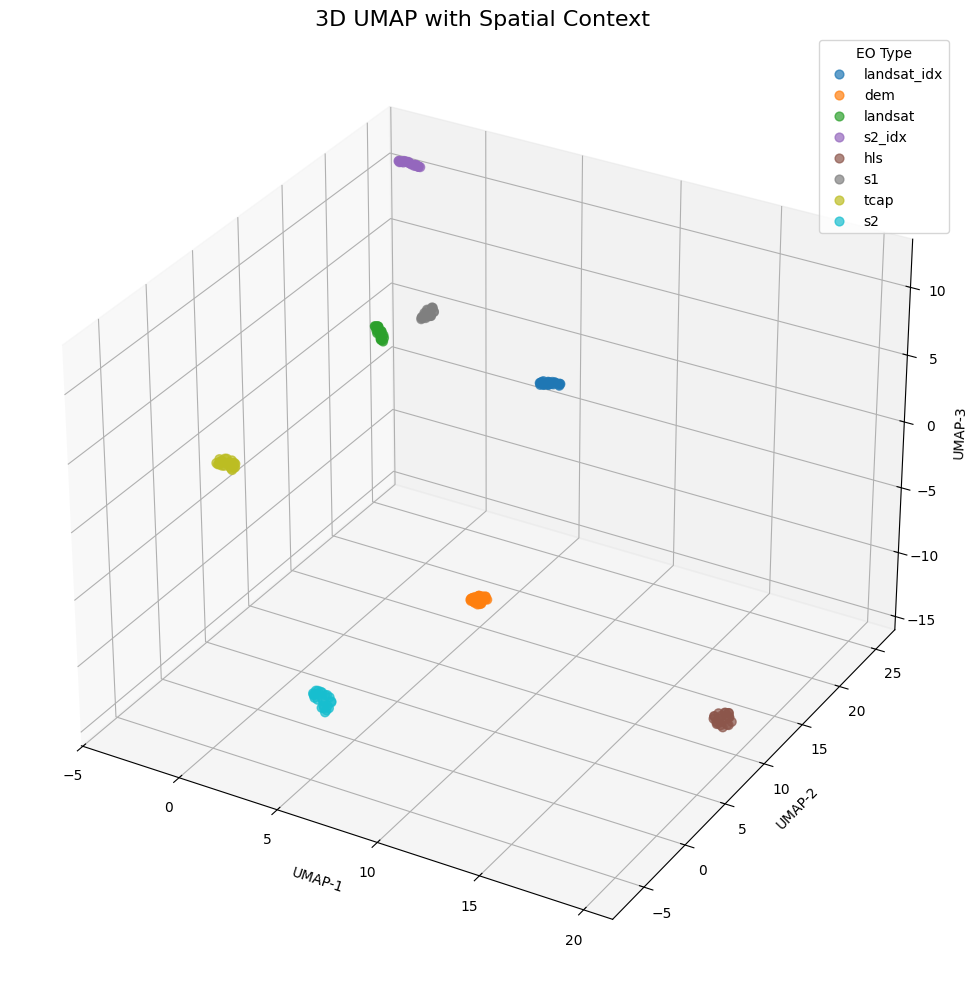

In [46]:
import numpy as np
import matplotlib.pyplot as plt
import umap
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

def visualize_umap_all_embeddings_with_spatial(
    embedding_dict,
    sample_limit=1000,
    n_components=3,
    n_neighbors=25,
    min_dist=0.1,
    alpha=100.0  # spatial weight
):
    all_embeddings = []
    all_coords = []
    all_labels = []

    for eo, data in embedding_dict.items():
        emb = data['embeddings']
        coords = data.get('coords')

        n = len(emb)
        if n == 0 or coords is None:
            continue

        limit = min(sample_limit, n)
        emb = emb[:limit]
        coords = coords[:limit]
        label = [eo] * limit

        all_embeddings.append(emb)
        all_coords.append(coords)
        all_labels.extend(label)

    # Stack data
    X_emb = np.vstack(all_embeddings)
    X_coords = np.vstack(all_coords)

    # Normalize spatial coordinates to [0, 1]
    X_coords = (X_coords - X_coords.min(axis=0)) / (X_coords.max(axis=0) - X_coords.min(axis=0))

    # Scale spatial features
    X_spatial = X_coords * alpha

    # Combine embeddings and spatial info
    X_combined = np.hstack([X_emb, X_spatial])

    # UMAP projection
    reducer = umap.UMAP(
        n_components=n_components,
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        metric='cosine',
        random_state=42
    )
    X_umap = reducer.fit_transform(X_combined)

    # Plot
    unique_labels = list(set(all_labels))
    colors = plt.cm.get_cmap('tab10', len(unique_labels))

    if n_components == 3:
        fig = plt.figure(figsize=(14, 10))
        ax = fig.add_subplot(111, projection='3d')
        for i, eo in enumerate(unique_labels):
            idx = [j for j, label in enumerate(all_labels) if label == eo]
            ax.scatter(X_umap[idx, 0], X_umap[idx, 1], X_umap[idx, 2],
                       label=eo, s=40, alpha=0.7, color=colors(i))
        ax.set_xlabel("UMAP-1")
        ax.set_ylabel("UMAP-2")
        ax.set_zlabel("UMAP-3")
        ax.set_title("3D UMAP with Spatial Context", fontsize=16)
    else:
        plt.figure(figsize=(12, 8))
        for i, eo in enumerate(unique_labels):
            idx = [j for j, label in enumerate(all_labels) if label == eo]
            plt.scatter(X_umap[idx, 0], X_umap[idx, 1],
                        label=eo, s=40, alpha=0.7, color=colors(i))
        plt.xlabel("UMAP-1")
        plt.ylabel("UMAP-2")
        plt.title("2D UMAP with Spatial Context", fontsize=16)

    plt.legend(title="EO Type")
    plt.tight_layout()
    plt.show()

# Example use (with spatial influence)
visualize_umap_all_embeddings_with_spatial(
    embedding_dict,
    n_components=3,
    alpha=5.0  # try 1.0, 5.0, 10.0 to see the effect
)


# Fusion model

Prediction batch stats:
Min: 0.07, Max: 0.07, Mean: 0.07
[Epoch 1] Train Loss: 0.0006 | Val Loss: 0.9398
Prediction batch stats:
Min: 0.10, Max: 0.10, Mean: 0.10
[Epoch 2] Train Loss: 0.0032 | Val Loss: 0.8762
Prediction batch stats:
Min: 0.14, Max: 0.14, Mean: 0.14
[Epoch 3] Train Loss: 0.0005 | Val Loss: 0.8045
Prediction batch stats:
Min: 0.16, Max: 0.16, Mean: 0.16
[Epoch 4] Train Loss: 0.0002 | Val Loss: 0.7682
Prediction batch stats:
Min: 0.16, Max: 0.16, Mean: 0.16
[Epoch 5] Train Loss: 0.0013 | Val Loss: 0.7735
Prediction batch stats:
Min: 0.14, Max: 0.14, Mean: 0.14
[Epoch 6] Train Loss: 0.0011 | Val Loss: 0.8018
Prediction batch stats:
Min: 0.12, Max: 0.12, Mean: 0.12
[Epoch 7] Train Loss: 0.0003 | Val Loss: 0.8384
Prediction batch stats:
Min: 0.10, Max: 0.10, Mean: 0.10
[Epoch 8] Train Loss: 0.0000 | Val Loss: 0.8679
Prediction batch stats:
Min: 0.10, Max: 0.10, Mean: 0.10
[Epoch 9] Train Loss: 0.0004 | Val Loss: 0.8794
Prediction batch stats:
Min: 0.10, Max: 0.10, Mean: 0.1

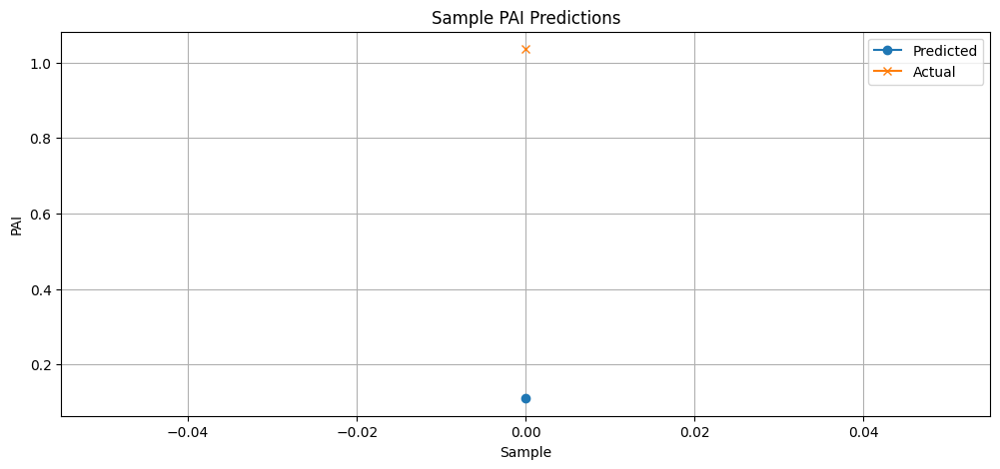

Validation sample count: 1


In [47]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import random

# --- Attention-Based Fusion Module ---
class AttentionFusion(nn.Module):
    def __init__(self, num_eos=8, emb_dim=64):
        super().__init__()
        self.query = nn.Linear(emb_dim, emb_dim)
        self.key = nn.Linear(emb_dim, emb_dim)
        self.value = nn.Linear(emb_dim, emb_dim)
        self.scale = emb_dim ** 0.5

    def forward(self, x):  # x: [B, N, D]
        Q = self.query(x)
        K = self.key(x)
        V = self.value(x)
        attn_scores = torch.matmul(Q, K.transpose(-2, -1)) / self.scale  # [B, N, N]
        attn_weights = F.softmax(attn_scores, dim=-1)
        fused = torch.matmul(attn_weights, V)  # [B, N, D]
        return fused.mean(dim=1)  # [B, D]

# --- Regression Model with Fusion ---
class PAIRegressorWithFusion(nn.Module):
    def __init__(self, num_eos=8, emb_dim=64, hidden_dim=128):
        super().__init__()
        self.fusion = AttentionFusion(num_eos, emb_dim)
        self.regressor = nn.Sequential(
            nn.Linear(emb_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, x):  # x: [B, N, D]
        fused = self.fusion(x)  # [B, D]
        return self.regressor(fused).squeeze(1)

# --- Prepare Fusion Dataset from embedding_dict ---
# def prepare_fusion_dataset(embedding_dict, eo_list):
#     tensors = []
#     for eo in eo_list:
#         emb = torch.tensor(embedding_dict[eo]['embeddings'], dtype=torch.float32)  # [B, D]
#         tensors.append(emb.unsqueeze(1))  # [B, 1, D]
#     x = torch.cat(tensors, dim=1)  # [B, N, D]

#     # Assume targets are the same for all EO sources
#     y = torch.tensor(embedding_dict[eo_list[0]]['targets'], dtype=torch.float32)  # [B]
#     return TensorDataset(x, y)

def align_and_prepare_dataset(embedding_dict, eo_list, emb_dim=64, min_sources=6):
    from collections import defaultdict

    # Step 1: Collect tile -> list of (eo, idx) mappings
    coord_to_eo_idx = defaultdict(list)
    for eo in eo_list:
        coords = embedding_dict[eo]['coords']
        for idx, coord in enumerate(coords):
            coord_tuple = tuple(coord)
            coord_to_eo_idx[coord_tuple].append((eo, idx))

    # Step 2: Filter tiles with at least min_sources available
    filtered_tiles = {coord: entries for coord, entries in coord_to_eo_idx.items() if len(entries) >= min_sources}
    if not filtered_tiles:
        raise ValueError(f"No tiles found with at least {min_sources} sources.")

    # Step 3: Construct aligned dataset
    x_list = []
    y_list = []

    for coord, eo_indices in filtered_tiles.items():
        eo_to_idx = dict(eo_indices)

        emb_stack = []
        for eo in eo_list:
            if eo in eo_to_idx:
                idx = eo_to_idx[eo]
                emb = embedding_dict[eo]['embeddings'][idx]
                # Pad or trim to emb_dim
                if emb.shape[0] < emb_dim:
                    emb = np.pad(emb, (0, emb_dim - emb.shape[0]), mode='constant')
                elif emb.shape[0] > emb_dim:
                    emb = emb[:emb_dim]
            else:
                # Missing EO source — use zero vector
                emb = np.zeros(emb_dim, dtype=np.float32)
            emb_stack.append(torch.tensor(emb, dtype=torch.float32).unsqueeze(0))

        x = torch.cat(emb_stack, dim=0)  # [N, D]
        x_list.append(x.unsqueeze(0))    # [1, N, D]

        # Use target from a reliable EO source (e.g. first in list that exists for this coord)
        for eo in eo_list:
            if eo in eo_to_idx:
                idx = eo_to_idx[eo]
                target = embedding_dict[eo]['targets'][idx]
                y_list.append(torch.tensor(target, dtype=torch.float32))
                break

    x_tensor = torch.cat(x_list, dim=0)  # [B, N, D]
    y_tensor = torch.stack(y_list)       # [B]

    return TensorDataset(x_tensor, y_tensor)



# --- Training Utilities ---
def train_one_epoch(model, dataloader, optimizer, loss_fn, device):
    model.train()
    total_loss = 0
    for x, y in dataloader:
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        pred = model(x)
        loss = loss_fn(pred, y)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * x.size(0)
    return total_loss / len(dataloader.dataset)

def evaluate(model, dataloader, loss_fn, device):
    model.eval()
    preds, targets = [], []
    with torch.no_grad():
        for x, y in dataloader:
            x, y = x.to(device), y.to(device)
            pred = model(x)
            preds.append(pred.cpu())
            targets.append(y.cpu())
    preds = torch.cat(preds)
    targets = torch.cat(targets)
    loss = loss_fn(preds, targets)

    print("Prediction batch stats:")
    print(f"Min: {preds.min().item():.2f}, Max: {preds.max().item():.2f}, Mean: {preds.mean().item():.2f}")




    return loss.item(), preds, targets

# --- Visualization (Optional) ---
# def plot_sample_predictions(preds, targets, n=20):
#     import matplotlib.pyplot as plt
#     indices = random.sample(range(len(preds)), n)
#     plt.figure(figsize=(12, 5))
#     plt.plot(preds[indices], label="Predicted", marker='o')
#     plt.plot(targets[indices], label="Actual", marker='x')
#     plt.title("Sample PAI Predictions")
#     plt.xlabel("Sample")
#     plt.ylabel("PAI")
#     plt.legend()
#     plt.grid(True)
#     plt.show()

def plot_sample_predictions(preds, targets, n=20):
    import matplotlib.pyplot as plt
    n = min(n, len(preds))  # <-- Prevent sampling too many
    indices = random.sample(range(len(preds)), n)
    plt.figure(figsize=(12, 5))
    plt.plot(range(n), preds[indices], label="Predicted", marker='o')
    plt.plot(range(n), targets[indices], label="Actual", marker='x')
    plt.title("Sample PAI Predictions")
    plt.xlabel("Sample")
    plt.ylabel("PAI")
    plt.legend()
    plt.grid(True)
    plt.show()

# --- Main Pipeline ---
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
eo_list = ['s1', 's2', 'landsat', 'landsat_idx', 'hls', 'tcap', 'dem', 's2_idx']

# Prepare data
full_dataset = align_and_prepare_dataset(embedding_dict, eo_list)
train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
train_ds, val_ds = torch.utils.data.random_split(full_dataset, [train_size, val_size])

train_loader = DataLoader(train_ds, batch_size=32, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=32)

# Initialize model
model = PAIRegressorWithFusion(num_eos=len(eo_list), emb_dim=64).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.MSELoss()

# Train
epochs = 20
for epoch in range(1, epochs + 1):
    train_loss = train_one_epoch(model, train_loader, optimizer, loss_fn, device)
    val_loss, preds, targets = evaluate(model, val_loader, loss_fn, device)
    print(f"[Epoch {epoch}] Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")

# Visualize results
plot_sample_predictions(preds.numpy(), targets.numpy())
print(f"Validation sample count: {len(targets)}")

# Inference Prep

In [48]:
import os
import numpy as np
import rasterio
from rasterio.enums import Resampling
from glob import glob

# Define your GeoTIFF directory
tiff_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/prediction_surface'

# Optional: manually order files if needed for fusion model
tiff_paths = sorted(glob(os.path.join(tiff_dir, '*.tif')))

# Choose base image (usually highest resolution like S1 10m)
base_path = [p for p in tiff_paths if 's1' in os.path.basename(p).lower()][0]

# Read base image for spatial reference
with rasterio.open(base_path) as base_src:
    base_profile = base_src.profile
    base_shape = (base_src.height, base_src.width)
    base_transform = base_src.transform
    base_crs = base_src.crs

# Initialize list for stacked bands
stacked_bands = []

# Resample & align each input image to base
for path in tiff_paths:
    with rasterio.open(path) as src:
        # Read and resample to match base grid
        data = src.read(
            out_shape=(src.count, base_shape[0], base_shape[1]),
            resampling=Resampling.bilinear  # or nearest for categorical data
        )

        # Normalize nodata handling
        data = np.nan_to_num(data, nan=0)

        # If multiband, split along channel dim
        if src.count > 1:
            for b in data:
                stacked_bands.append(b)
        else:
            stacked_bands.append(data[0])

print(f"Stacked {len(stacked_bands)} bands from {len(tiff_paths)} GeoTIFFs")

# Final shape for inference: [C, H, W] or [H, W, C]
input_tensor = np.stack(stacked_bands, axis=0)  # shape: [C, H, W]
# Optional transpose: input_tensor = np.transpose(input_tensor, (1, 2, 0))  # [H, W, C]

# Convert to torch tensor if needed
import torch
input_tensor = torch.from_numpy(input_tensor).float().unsqueeze(0)  # Add batch dim
print("Input tensor shape (B, C, H, W):", input_tensor.shape)


# Debug: inspect raw EO values
print("Per-band stats:")
for i in range(input_tensor.shape[1]):
    band = input_tensor[0, i]  # shape: (H, W)
    print(f"Band {i+1}: min={band.min().item():.2f}, max={band.max().item():.2f}, mean={band.mean().item():.2f}")


Stacked 46 bands from 8 GeoTIFFs
Input tensor shape (B, C, H, W): torch.Size([1, 46, 223, 237])
Per-band stats:
Band 1: min=392.04, max=607.10, mean=576.77
Band 2: min=0.29, max=36.23, mean=7.72
Band 3: min=0.42, max=0.83, mean=0.67
Band 4: min=-0.78, max=-0.50, mean=-0.69
Band 5: min=-0.67, max=-0.49, mean=-0.60
Band 6: min=0.14, max=0.54, mean=0.36
Band 7: min=-0.23, max=0.39, mean=0.16
Band 8: min=-0.39, max=0.23, mean=-0.16
Band 9: min=-0.05, max=0.70, mean=0.52
Band 10: min=0.02, max=0.09, mean=0.05
Band 11: min=0.02, max=0.07, mean=0.04
Band 12: min=7810.24, max=9096.09, mean=8305.48
Band 13: min=0.10, max=0.39, mean=0.21
Band 14: min=0.09, max=0.32, mean=0.19
Band 15: min=8923.21, max=14642.84, mean=11152.06
Band 16: min=0.42, max=0.86, mean=0.61
Band 17: min=-0.78, max=-0.48, mean=-0.65
Band 18: min=-0.70, max=-0.50, mean=-0.63
Band 19: min=0.17, max=0.56, mean=0.31
Band 20: min=-0.21, max=0.37, mean=0.04
Band 21: min=-0.37, max=0.21, mean=-0.04
Band 22: min=-1.00, max=-1.00, m


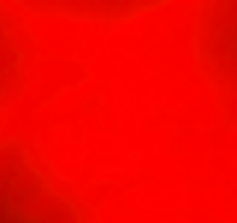

In [49]:
import folium
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import tempfile
from pyproj import Transformer

# Pick a few bands to visualize (e.g., RGB from Sentinel-2 or any 3 continuous bands)
# Make sure these bands exist and are not all zero
rgb_bands = [0, 1, 2]  # Change indices depending on your data stack

# Get data to plot
visual_array = np.stack([stacked_bands[i] for i in rgb_bands], axis=-1)

# Normalize for display (0-1)
def normalize(arr):
    arr = arr.astype(np.float32)
    min_val = np.nanpercentile(arr, 2)
    max_val = np.nanpercentile(arr, 98)
    return np.clip((arr - min_val) / (max_val - min_val + 1e-5), 0, 1)

rgb_norm = normalize(visual_array)

# Save image temporarily
tmp_img_path = tempfile.mktemp(suffix=".png")
plt.imsave(tmp_img_path, rgb_norm)

# Convert bounds to EPSG:4326
with rasterio.open(base_path) as src:
    bounds = src.bounds
    crs = src.crs

transformer = Transformer.from_crs(crs.to_string(), 'EPSG:4326', always_xy=True)
min_lon, min_lat = transformer.transform(bounds.left, bounds.bottom)
max_lon, max_lat = transformer.transform(bounds.right, bounds.top)

# Create and display the Folium map
center = [(min_lat + max_lat) / 2, (min_lon + max_lon) / 2]
m = folium.Map(location=center, zoom_start=13)

overlay = folium.raster_layers.ImageOverlay(
    name='EO Input Stack (RGB)',
    image=tmp_img_path,
    bounds=[[min_lat, min_lon], [max_lat, max_lon]],
    opacity=0.7,
    interactive=True,
    cross_origin=False,
    zindex=1,
)

overlay.add_to(m)
folium.LayerControl().add_to(m)

# Display the map
m


# Inference

In [50]:
import torch
import numpy as np

# Your input tensor: shape (1, 46, 223, 237)
input_tensor = input_tensor.squeeze(0)  # (46, 223, 237)

H, W = input_tensor.shape[1], input_tensor.shape[2]
num_pixels = H * W

# Flatten spatial dims: (46, H, W) -> (num_pixels, 46)
flat_pixels = input_tensor.reshape(46, -1).permute(1, 0)  # (num_pixels, 46)

# Define EO bands per source (example, adjust to your data)
eo_band_counts = {
    's1': 6,
    'dem': 4,
    'hls': 6,
    'landsat': 6,
    'landsat_idx': 6,
    'tcap': 6,
    's2': 6,
    's2_idx': 6
}

eo_list = list(eo_band_counts.keys())
emb_dim = 64

# Compute cumulative band indices for slicing
band_indices = []
start = 0
for eo in eo_list:
    end = start + eo_band_counts[eo]
    band_indices.append((start, end))
    start = end

# For each pixel, extract embeddings per EO source and pad/trim to emb_dim
all_embeddings = []
for start_idx, end_idx in band_indices:
    eo_bands = flat_pixels[:, start_idx:end_idx]  # shape: (num_pixels, eo_band_count)
    # Pad or trim to emb_dim
    if eo_bands.shape[1] < emb_dim:
        padding = torch.zeros((num_pixels, emb_dim - eo_bands.shape[1]), dtype=eo_bands.dtype)
        eo_emb = torch.cat([eo_bands, padding], dim=1)
    else:
        eo_emb = eo_bands[:, :emb_dim]
    all_embeddings.append(eo_emb.unsqueeze(1))  # shape: (num_pixels, 1, emb_dim)

# Stack embeddings per EO: shape (num_pixels, 8, emb_dim)
fusion_input = torch.cat(all_embeddings, dim=1)

print(f"Fusion input shape (num_pixels, num_eos, emb_dim): {fusion_input.shape}")
# Expected: (223*237, 8, 64) = (num_pixels, 8, 64)

# Move to device
fusion_input = fusion_input.to(device)

# Run inference in batches to avoid memory issues
batch_size = 4096
model.eval()
predictions = []

with torch.no_grad():
    for i in range(0, num_pixels, batch_size):
        batch = fusion_input[i:i+batch_size]
        preds = model(batch)  # Output shape: (batch_size,)a
        predictions.append(preds.cpu())

# Concatenate all predictions
preds_all = torch.cat(predictions)

# Reshape back to raster shape
pred_map = preds_all.reshape(H, W).numpy()
print(f"Pred map min: {pred_map.min()}, max: {pred_map.max()}, mean: {pred_map.mean()}")

print(f"Prediction map shape: {pred_map.shape}")


Fusion input shape (num_pixels, num_eos, emb_dim): torch.Size([52851, 8, 64])
Pred map min: -213.7765655517578, max: -145.19973754882812, mean: -153.3672637939453
Prediction map shape: (223, 237)


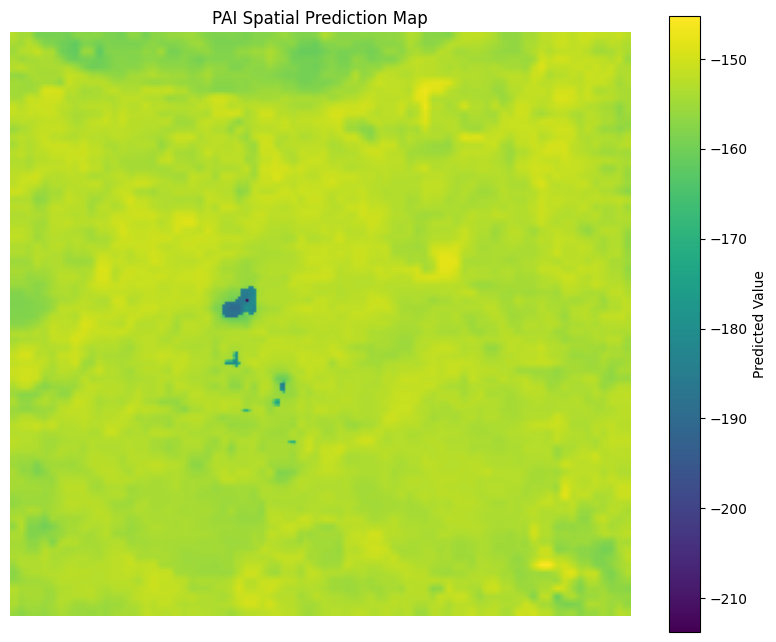

In [51]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.imshow(pred_map, cmap='viridis')
plt.colorbar(label="Predicted Value")
plt.title("PAI Spatial Prediction Map")
plt.axis('off')
plt.show()


In [34]:
import rasterio
from rasterio.transform import from_origin
import os
import numpy as np

# Your predicted map
# pred_map: numpy array of shape (223, 237)

# Save path
output_path = "/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/results/predicted_pai_map.tif"

# Assume top-left corner (origin) and 10m resolution
# You can tweak (x_min, y_max) to match your actual location
x_min, y_max = 0, 0  # Change if needed
resolution = 10
transform = from_origin(x_min, y_max, resolution, resolution)

# Save GeoTIFF
with rasterio.open(
    output_path,
    'w',
    driver='GTiff',
    height=pred_map.shape[0],
    width=pred_map.shape[1],
    count=1,
    dtype=pred_map.dtype,
    crs='EPSG:4326',  # Set correct CRS if known (e.g., EPSG:32616 for UTM Zone 16N)
    transform=transform
) as dst:
    dst.write(pred_map, 1)

print(f"✅ Saved predicted map to:\n{output_path}")


✅ Saved predicted map to:
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/results/predicted_pai_map.tif
